<a href="https://colab.research.google.com/github/dlin262/Daniel-Portfolio-Web/blob/main/survery_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import math, time, random, datetime

import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

import missingno

#Let's be rebels and ignore warnings for now
import warnings
warnings.filterwarnings('ignore')

In [ ]:
raw_dataset = pd.read_csv('survey_results_public.csv')

In [ ]:
raw_dataset.head()

,Respondent,MainBranch,Hobbyist,Age,Age1stCode,CompFreq,CompTotal,ConvertedComp,Country,CurrencyDesc,...,SurveyEase,SurveyLength,Trans,UndergradMajor,WebframeDesireNextYear,WebframeWorkedWith,WelcomeChange,WorkWeekHrs,YearsCode,YearsCodePro
0,1,I am a developer by profession,Yes,NaN,13,Monthly,NaN,NaN,Germany,European Euro,...,Neither easy nor difficult,Appropriate in length,No,"Computer science, computer engineering, or sof...",ASP.NET Core,ASP.NET;ASP.NET Core,Just as welcome now as I felt last year,50.0,36,27
1,2,I am a developer by profession,No,NaN,19,NaN,NaN,NaN,United Kingdom,Pound sterling,...,NaN,NaN,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat more welcome now than last year,NaN,7,4
2,3,I code primarily as a hobby,Yes,NaN,15,NaN,NaN,NaN,Russian Federation,NaN,...,Neither easy nor difficult,Appropriate in length,NaN,NaN,NaN,NaN,Somewhat more welcome now than last year,NaN,4,NaN
3,4,I am a developer by profession,Yes,25.0,18,NaN,NaN,NaN,Albania,Albanian lek,...,NaN,NaN,No,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat less welcome now than last year,40.0,7,4
4,5,"I used to be a developer by profession, but no...",Yes,31.0,16,NaN,NaN,NaN,United States,NaN,...,Easy,Too short,No,"Computer science, computer engineering, or sof...",Django;Ruby on Rails,Ruby on Rails,Just as welcome now as I felt last year,NaN,15,8


In [ ]:
#check all the 61 columns
raw_dataset.columns

Index(['Respondent', 'MainBranch', 'Hobbyist', 'Age', 'Age1stCode', 'CompFreq',
       'CompTotal', 'ConvertedComp', 'Country', 'CurrencyDesc',
       'CurrencySymbol', 'DatabaseDesireNextYear', 'DatabaseWorkedWith',
       'DevType', 'EdLevel', 'Employment', 'Ethnicity', 'Gender', 'JobFactors',
       'JobSat', 'JobSeek', 'LanguageDesireNextYear', 'LanguageWorkedWith',
       'MiscTechDesireNextYear', 'MiscTechWorkedWith',
       'NEWCollabToolsDesireNextYear', 'NEWCollabToolsWorkedWith', 'NEWDevOps',
       'NEWDevOpsImpt', 'NEWEdImpt', 'NEWJobHunt', 'NEWJobHuntResearch',
       'NEWLearn', 'NEWOffTopic', 'NEWOnboardGood', 'NEWOtherComms',
       'NEWOvertime', 'NEWPurchaseResearch', 'NEWPurpleLink', 'NEWSOSites',
       'NEWStuck', 'OpSys', 'OrgSize', 'PlatformDesireNextYear',
       'PlatformWorkedWith', 'PurchaseWhat', 'Sexuality', 'SOAccount',
       'SOComm', 'SOPartFreq', 'SOVisitFreq', 'SurveyEase', 'SurveyLength',
       'Trans', 'UndergradMajor', 'WebframeDesireNextYear',
  

In [ ]:
#check the shape of raw data
raw_dataset.shape

(64461, 61)

In [ ]:
#get the schema dataset which are questions that are asked
questions = pd.read_csv('survey_results_schema.csv')

In [ ]:
questions.head()

,Column,QuestionText
0,Respondent,Randomized respondent ID number (not in order ...
1,MainBranch,Which of the following options best describes ...
2,Hobbyist,Do you code as a hobby?
3,Age,What is your age (in years)? If you prefer not...
4,Age1stCode,At what age did you write your first line of c...


In [ ]:
#set the colum into index
questions.set_index('Column',inplace=True,drop=True)

In [ ]:
questions.head()

,QuestionText
Column,
Respondent,Randomized respondent ID number (not in order ...
MainBranch,Which of the following options best describes ...
Hobbyist,Do you code as a hobby?
Age,What is your age (in years)? If you prefer not...
Age1stCode,At what age did you write your first line of c...


In [ ]:
#Since questions dataset contains just one column, let's retrieve the column as a Pandas series.
questions = questions.QuestionText
questions

Column
Respondent            Randomized respondent ID number (not in order ...
MainBranch            Which of the following options best describes ...
Hobbyist                                        Do you code as a hobby?
Age                   What is your age (in years)? If you prefer not...
Age1stCode            At what age did you write your first line of c...
                                            ...                        
WebframeWorkedWith    Which web frameworks have you done extensive d...
WelcomeChange         Compared to last year, how welcome do you feel...
WorkWeekHrs           On average, how many hours per week do you wor...
YearsCode             Including any education, how many years have y...
YearsCodePro          NOT including education, how many years have y...
Name: QuestionText, Length: 61, dtype: object

In [ ]:
#can call the questions easily like this
questions['YearsCodePro']

'NOT including education, how many years have you coded professionally (as a part of your work)?'

# Data Preprocessing and Cleaning


## While the survey responses contain a wealth of information, we'll limit our analysis to the following areas:

- Demographics of the survey respondents and the global programming community
- Distribution of programming skills, experience, and preferences
- Employment-related information, preferences, and opinions

In [ ]:
selected_columns = [
    # Demographics
    'Country',
    'Age',
    'Gender',
    'EdLevel',
    'UndergradMajor',
    # Programming experience
    'Hobbyist',
    'Age1stCode',
    'YearsCode',
    'YearsCodePro',
    'LanguageWorkedWith',
    'LanguageDesireNextYear',
    'NEWLearn',
    'NEWStuck',
    # Employment
    'Employment',
    'DevType',
    'WorkWeekHrs',
    'JobSat',
    'JobFactors',
    'NEWOvertime',
    'NEWEdImpt',
    'ConvertedComp'
]

In [ ]:
analysis_data = raw_dataset[selected_columns]

In [ ]:
analysis_data.head()

,Country,Age,Gender,EdLevel,UndergradMajor,Hobbyist,Age1stCode,YearsCode,YearsCodePro,LanguageWorkedWith,...,NEWLearn,NEWStuck,Employment,DevType,WorkWeekHrs,JobSat,JobFactors,NEWOvertime,NEWEdImpt,ConvertedComp
0,Germany,NaN,Man,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Computer science, computer engineering, or sof...",Yes,13,36,27,C#;HTML/CSS;JavaScript,...,Once a year,Visit Stack Overflow;Go for a walk or other ph...,"Independent contractor, freelancer, or self-em...","Developer, desktop or enterprise applications;...",50.0,Slightly satisfied,"Languages, frameworks, and other technologies ...",Often: 1-2 days per week or more,Fairly important,NaN
1,United Kingdom,NaN,NaN,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",No,19,7,4,JavaScript;Swift,...,Once a year,Visit Stack Overflow;Go for a walk or other ph...,Employed full-time,"Developer, full-stack;Developer, mobile",NaN,Very dissatisfied,NaN,NaN,Fairly important,NaN
2,Russian Federation,NaN,NaN,NaN,NaN,Yes,15,4,NaN,Objective-C;Python;Swift,...,Once a decade,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,25.0,Man,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Computer science, computer engineering, or sof...",Yes,18,7,4,NaN,...,Once a year,NaN,NaN,NaN,40.0,Slightly dissatisfied,Flex time or a flexible schedule;Office enviro...,Occasionally: 1-2 days per quarter but less th...,Not at all important/not necessary,NaN
4,United States,31.0,Man,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",Yes,16,15,8,HTML/CSS;Ruby;SQL,...,Once a year,Call a coworker or friend;Visit Stack Overflow...,Employed full-time,NaN,NaN,NaN,NaN,NaN,Very important,NaN


In [ ]:
analysis_data.shape

(64461, 21)

In [ ]:
analysis_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64461 entries, 0 to 64460
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country                 64072 non-null  object 
 1   Age                     45446 non-null  float64
 2   Gender                  50557 non-null  object 
 3   EdLevel                 57431 non-null  object 
 4   UndergradMajor          50995 non-null  object 
 5   Hobbyist                64416 non-null  object 
 6   Age1stCode              57900 non-null  object 
 7   YearsCode               57684 non-null  object 
 8   YearsCodePro            46349 non-null  object 
 9   LanguageWorkedWith      57378 non-null  object 
 10  LanguageDesireNextYear  54113 non-null  object 
 11  NEWLearn                56156 non-null  object 
 12  NEWStuck                54983 non-null  object 
 13  Employment              63854 non-null  object 
 14  DevType                 49370 non-null

<AxesSubplot:>

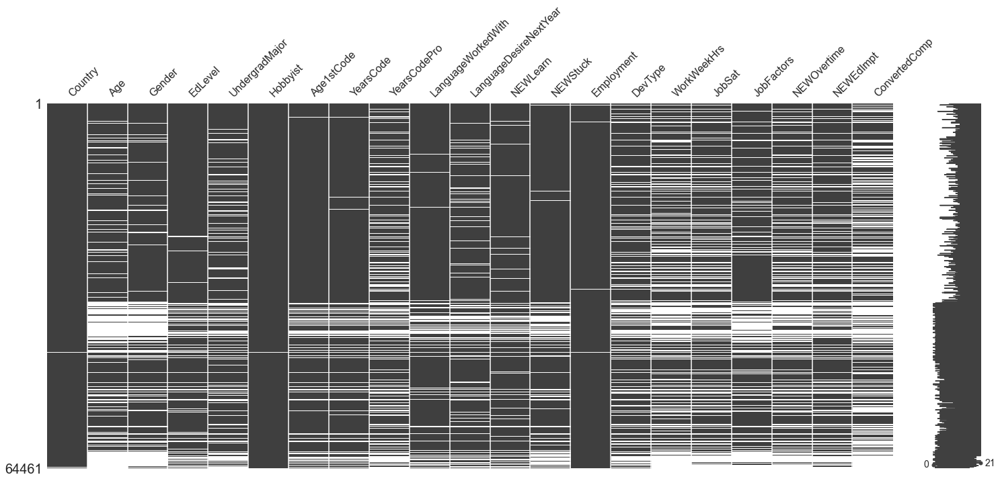

In [ ]:
#check the missing null datas
missingno.matrix(analysis_data)

### Lets first deal with numeric columns which are Age, Age1stCode, YearsCode, YearsCodePro and WorkWeekHrs

In [ ]:
analysis_data['Age'].unique()

array([  nan,  25. ,  31. ,  36. ,  30. ,  22. ,  23. ,  49. ,  53. ,
        27. ,  45. ,  32. ,  24. ,  40. ,  18. ,  39. ,  29. ,  16. ,
        34. ,  19. ,  35. ,  20. ,  38. ,  57. ,  28. ,  17. ,  44. ,
        21. ,  48. ,  26. ,  42. ,  55. ,  37. ,  50. ,  41. ,  64. ,
        63. ,  33. ,  43. ,  51. ,  60. ,  59. ,  62. ,  69. ,  52. ,
        46. ,  49.5,  56. ,  47. ,  15. ,  72. ,  13. ,  71. ,  54. ,
        70. ,  11. ,  14. ,  61. ,  26.8,  86. ,  58. ,  67. ,  94. ,
        65. ,  66. ,  84. ,  73. ,  78. ,  68. ,  99. ,  74. ,  12. ,
        77. ,  15.5,  85. ,  76. ,  35.7,  32.5,  81. ,  23.8,  97. ,
        96. ,  26.5,   3. ,  24.5,  14.7,  34.5,   5. ,   1. ,  20.5,
        79. , 279. ,  22.5,  27.5,  32.8,  10. ,  89. ,  80. ,  98. ,
        19.8,   7. ,  21.5,  31.5,  88. ,  39.5,  16.5,  75. ,  83. ,
        23.4,  95. ,  14.5])

In [ ]:
analysis_data['Age1stCode'].unique()

array(['13', '19', '15', '18', '16', '14', '12', '20', '42', '8', '25',
       '22', '30', '17', '21', '10', '46', '9', '7', '11', '6', nan, '31',
       '29', '5', 'Younger than 5 years', '28', '38', '23', '27', '41',
       '24', '53', '26', '35', '32', '40', '33', '36', '54', '48', '56',
       '45', '44', '34', 'Older than 85', '39', '51', '68', '50', '37',
       '47', '43', '52', '85', '64', '55', '58', '49', '76', '72', '73',
       '83', '63'], dtype=object)

In [ ]:
analysis_data['YearsCode'].unique()

array(['36', '7', '4', '15', '6', '17', '8', '10', '35', '5', '37', '19',
       '9', '22', '30', '23', '20', '2', 'Less than 1 year', '3', '13',
       '25', '16', '43', '11', '38', '33', nan, '24', '21', '12', '40',
       '27', '50', '46', '14', '18', '28', '32', '44', '26', '42', '31',
       '34', '29', '1', '39', '41', '45', 'More than 50 years', '47',
       '49', '48'], dtype=object)

In [ ]:
analysis_data['YearsCodePro'].unique()

array(['27', '4', nan, '8', '13', '2', '7', '20', '1', '23', '3', '12',
       '17', '18', '10', '14', '29', '6', '28', '9', '15', '11', '16',
       '25', 'Less than 1 year', '5', '21', '19', '35', '24', '32', '22',
       '30', '38', '26', '40', '33', '31', 'More than 50 years', '34',
       '36', '39', '37', '41', '45', '47', '42', '46', '50', '43', '44',
       '48', '49'], dtype=object)

In [ ]:
analysis_data['WorkWeekHrs'].unique()

array([ 50.        ,          nan,  40.        ,  39.        ,
        36.        ,  45.        ,  35.        ,  42.        ,
        37.        ,  30.        ,   5.        ,  43.        ,
        60.        ,  24.        ,  25.        ,  16.        ,
        32.        ,  38.        ,  55.        ,  20.        ,
        70.        ,  37.5       ,  47.        ,  44.        ,
        72.        ,   8.        ,  12.        ,  41.        ,
        90.        ,  27.        ,  48.        ,   4.        ,
        22.        ,  80.        ,  10.        ,  52.        ,
         8.5       , 120.        ,   9.        ,  15.        ,
        39.5       ,   6.        ,  54.        ,  40.5       ,
        46.        ,  18.        , 105.        ,  42.5       ,
       375.        ,  65.        ,  11.        ,  56.        ,
        75.        ,  49.        ,  95.        ,  28.        ,
        35.5       ,  33.        ,  43.5       ,   7.        ,
        98.        , 100.        ,  38.5       ,  21.  

In [ ]:
analysis_data['ConvertedComp'].unique()

array([    nan, 116000.,  32315., ...,    369.,    200.,  38759.])

### Lets change those columns into numeric and change non-numeric to NaN

In [ ]:
analysis_data['Age'] = pd.to_numeric(analysis_data['Age'],errors='coerce')
analysis_data['Age1stCode'] = pd.to_numeric(analysis_data['Age1stCode'],errors='coerce')
analysis_data['YearsCode'] = pd.to_numeric(analysis_data['YearsCode'],errors='coerce')
analysis_data['YearsCodePro'] = pd.to_numeric(analysis_data['YearsCodePro'],errors='coerce')
analysis_data['WorkWeekHrs'] = pd.to_numeric(analysis_data['WorkWeekHrs'],errors='coerce')
analysis_data['ConvertedComp'] = pd.to_numeric(analysis_data['ConvertedComp'],errors='coerce')

### Lets view those numeric columns

In [ ]:
analysis_data.describe()

,Age,Age1stCode,YearsCode,YearsCodePro,WorkWeekHrs,ConvertedComp
count,45446.000000,57473.000000,56784.000000,44133.000000,41151.000000,3.475600e+04
mean,30.834111,15.476572,12.782051,8.869667,40.782174,1.037561e+05
std,9.585392,5.114081,9.490657,7.759961,17.816383,2.268853e+05
min,1.000000,5.000000,1.000000,1.000000,1.000000,0.000000e+00
25%,24.000000,12.000000,6.000000,3.000000,40.000000,2.464800e+04
50%,29.000000,15.000000,10.000000,6.000000,40.000000,5.404900e+04
75%,35.000000,18.000000,17.000000,12.000000,44.000000,9.500000e+04
max,279.000000,85.000000,50.000000,50.000000,475.000000,2.000000e+06


### Since it is a survery data, unsurprisely I found out that there is a problem with Age Column where the minimum age is 1. Lets change the age to minimum 18 and maximum 100 and drop the unnecessary values

In [ ]:
analysis_data = analysis_data[analysis_data['Age'] >= 18]
analysis_data = analysis_data[analysis_data['Age'] <= 100]

### The same holds for WorkWeekHrs. Let's ignore entries where the value for the column is higher than 140 hours. (~20 hours per day).

In [ ]:
analysis_data = analysis_data[analysis_data['WorkWeekHrs'] <= 140]

### Lets dive into categorical data

### Cleaning Gender Column

In [ ]:
analysis_data['Gender'].unique()

array(['Man', 'Woman', nan,
       'Man;Non-binary, genderqueer, or gender non-conforming',
       'Non-binary, genderqueer, or gender non-conforming',
       'Woman;Non-binary, genderqueer, or gender non-conforming',
       'Woman;Man;Non-binary, genderqueer, or gender non-conforming',
       'Woman;Man'], dtype=object)

### We can see that there are some more options in the column. However, I will put only man and woman only in the column to simplify the analysis and change those optioins the nearest gender and for the rest like 'Non-binary' to NaN

In [ ]:
analysis_data['Gender'] = analysis_data['Gender'].apply(lambda x: x.split(';')[0] if ';' in str(x) else x)

In [ ]:
analysis_data['Gender'].unique()

array(['Man', 'Woman', nan,
       'Non-binary, genderqueer, or gender non-conforming'], dtype=object)

### Change the Non-binary.. value to NaN

In [ ]:
analysis_data['Gender'] = analysis_data['Gender'].apply(lambda x: np.nan if 'Non-binary' in str(x) else x)

In [ ]:
analysis_data['Gender'].unique()

array(['Man', 'Woman', nan], dtype=object)

### I cleaned up and prepared the dataset for analysis. Let's take a look at a sample of rows from the data frame.

In [ ]:
analysis_data.sample(5)

,Country,Age,Gender,EdLevel,UndergradMajor,Hobbyist,Age1stCode,YearsCode,YearsCodePro,LanguageWorkedWith,...,NEWLearn,NEWStuck,Employment,DevType,WorkWeekHrs,JobSat,JobFactors,NEWOvertime,NEWEdImpt,ConvertedComp
22953,Bosnia and Herzegovina,32.0,Man,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Computer science, computer engineering, or sof...",Yes,17.0,13.0,2.0,C#;Python;SQL;TypeScript,...,Every few months,Call a coworker or friend;Visit Stack Overflow...,Employed full-time,"Developer, back-end;Developer, full-stack",40.0,Slightly dissatisfied,"Flex time or a flexible schedule;Languages, fr...",Rarely: 1-2 days per year or less,Fairly important,NaN
32840,United States,41.0,Man,Some college/university study without earning ...,"Computer science, computer engineering, or sof...",Yes,8.0,18.0,16.0,Go;Java;JavaScript;PHP;TypeScript,...,Once every few years,Call a coworker or friend;Visit Stack Overflow...,Employed full-time,"Developer, full-stack;Developer, QA or test;De...",45.0,Slightly dissatisfied,"Languages, frameworks, and other technologies ...",Sometimes: 1-2 days per month but less than we...,Somewhat important,NaN
25055,Germany,31.0,Man,"Other doctoral degree (Ph.D., Ed.D., etc.)","Computer science, computer engineering, or sof...",Yes,17.0,14.0,5.0,Bash/Shell/PowerShell;Go;HTML/CSS;Java;Python;...,...,Every few months,Call a coworker or friend;Visit Stack Overflow,Employed full-time,"Developer, full-stack;DevOps specialist",35.0,Slightly satisfied,Specific department or team I’d be working on;...,Rarely: 1-2 days per year or less,Very important,86522.0
33286,United States,23.0,Man,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Computer science, computer engineering, or sof...",Yes,16.0,8.0,3.0,Bash/Shell/PowerShell;C#;HTML/CSS;Java;JavaScript,...,Once a year,Play games;Call a coworker or friend;Visit Sta...,Employed full-time,"Database administrator;Developer, back-end;Dev...",40.0,Very satisfied,"Flex time or a flexible schedule;Languages, fr...",Never,Not at all important/not necessary,82500.0
11589,Sweden,28.0,Man,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Computer science, computer engineering, or sof...",No,8.0,12.0,9.0,C#;HTML/CSS;JavaScript;SQL;TypeScript,...,Every few months,Call a coworker or friend;Visit Stack Overflow...,Employed full-time,"Developer, back-end;DevOps specialist",35.0,Neither satisfied nor dissatisfied,"Languages, frameworks, and other technologies ...",Occasionally: 1-2 days per quarter but less th...,Somewhat important,73644.0


# Exploratory Data Analysis (EDA) and Visualization

## Country

In [ ]:
questions.Country

'Where do you live?'

In [ ]:
analysis_data.Country.value_counts()

United States     7862
India             3034
United Kingdom    2541
Germany           2366
Canada            1290
                  ... 
Maldives             1
Monaco               1
Tajikistan           1
Niger                1
Yemen                1
Name: Country, Length: 156, dtype: int64

### Since there are a lot of countries, I will only analyze the top 10 countries

In [ ]:
top_10countries = analysis_data.Country.value_counts().head(10)
top_10countries = pd.DataFrame(top_10countries)
top_10countries

,Country
United States,7862
India,3034
United Kingdom,2541
Germany,2366
Canada,1290
France,1138
Brazil,1127
Netherlands,838
Poland,812
Australia,777


<AxesSubplot:title={'center':'Where do you live?'}, ylabel='Country'>

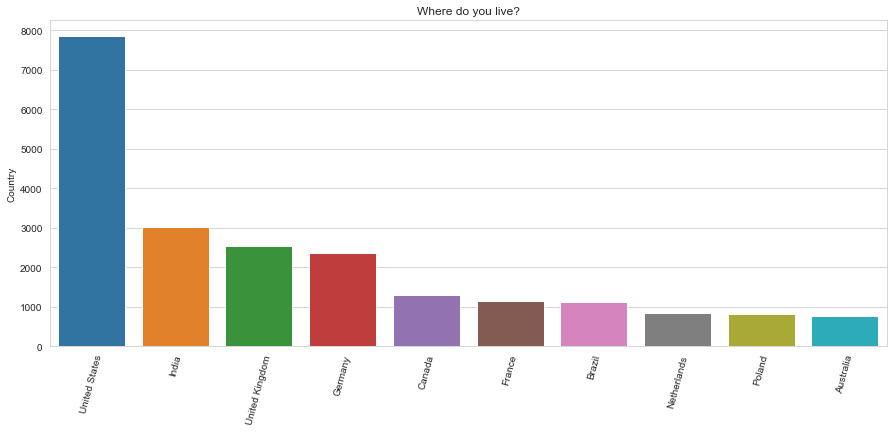

In [ ]:
plt.figure(figsize=(15,6))
plt.xticks(rotation=75)
plt.title(questions.Country)
sns.barplot(data=top_10countries,y=top_10countries.Country,x=top_10countries.index)

### We can clearly see that there are twice the numbers of people who live in US than second most people in chart which is India. The US is clearing more than leading the chart.

In [ ]:
import folium 
countries_geojson = 'https://raw.githubusercontent.com/johan/world.geo.json/master/countries.geo.json'

### Let's create a Choropleth map to better visualize the relative responses from various countries.

In [ ]:
country_counts = analysis_data.Country.value_counts()
country_counts_df = pd.DataFrame({ 'Country': country_counts.index, 'Count': country_counts.values})
country_counts_df

,Country,Count
0,United States,7862
1,India,3034
2,United Kingdom,2541
3,Germany,2366
4,Canada,1290
...,...,...
151,Maldives,1
152,Monaco,1
153,Tajikistan,1
154,Niger,1


In [ ]:
country_counts_df.at[0, 'Country'] = 'United States of America'
country_counts_df.at[12, 'Country'] = 'Russia'

In [ ]:
m = folium.Map(location=[30, 0], zoom_start=2)

folium.Choropleth(
    geo_data=countries_geojson,
    data=country_counts_df,
    columns=["Country", "Count"],
    key_on="feature.properties.name",
    threshold_scale=[1, 30, 100, 300, 1_000, 3_000, 10_000, 13_000],
    fill_color="OrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Respondents",
).add_to(m)

m

## Age


In [ ]:
age_counts = analysis_data.Age.value_counts()
age_counts_df = pd.DataFrame({ 'Age': age_counts.index, 'Count': age_counts.values})
age_counts_df

,Age,Count
0,25.0,2187
1,30.0,2166
2,28.0,2135
3,26.0,2062
4,27.0,2022
...,...,...
74,23.8,1
75,32.5,1
76,26.8,1
77,49.5,1


<AxesSubplot:title={'center':'What is your age (in years)? If you prefer not to answer, you may leave this question blank.'}, xlabel='Age', ylabel='Count'>

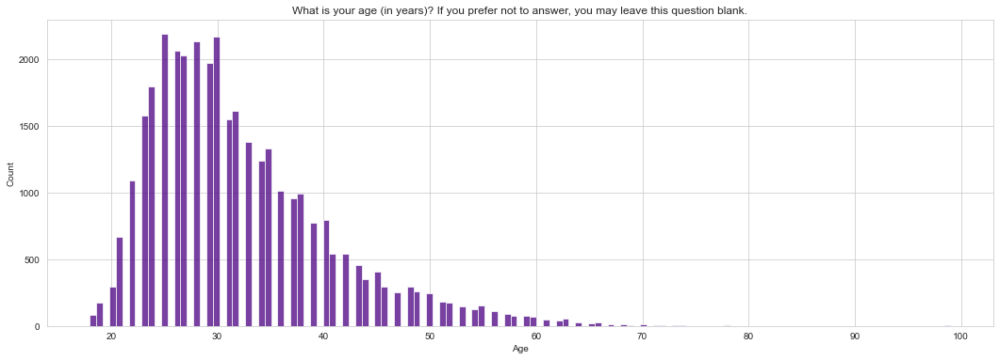

In [ ]:
plt.figure(figsize=(18,6))
plt.title(questions.Age)
sns.histplot(data=analysis_data,x='Age',color='indigo')

<AxesSubplot:title={'center':'What is your age (in years)? If you prefer not to answer, you may leave this question blank.'}, xlabel='Age', ylabel='Count'>

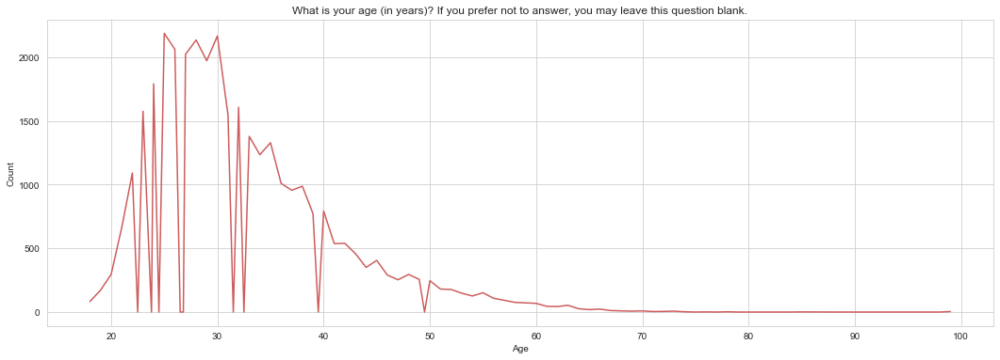

In [ ]:
plt.figure(figsize=(18,6))
plt.title(questions.Age)
sns.lineplot(data=age_counts_df,x='Age',y='Count',color='indianred')


### A lot of people are in between age 20 and 40 and highest is probably around 25

## Gender

In [ ]:
gender_counts = analysis_data['Gender'].value_counts()
gender_counts

Man      31786
Woman     2573
Name: Gender, dtype: int64

### Using pie chart to find the percentage of gender

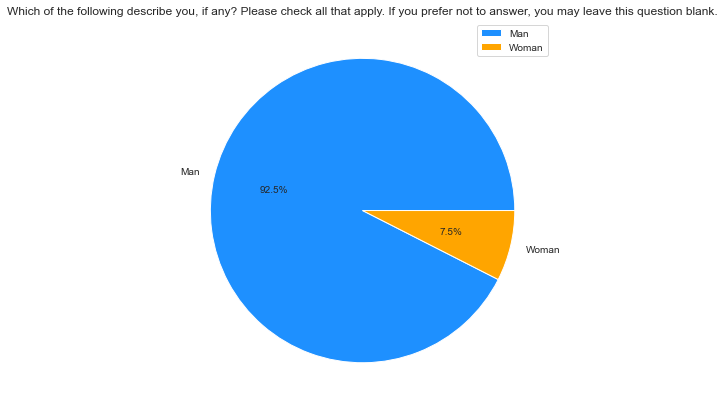

In [ ]:
plt.figure(figsize=(7,7))
plt.title(questions.Gender)
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', colors = ['dodgerblue', 'orange'])
plt.legend()

### This chart clearly stated that there are so much man which is 92.5% of males and on the other hand, there are only 7.5% of women

## Education Level

In [ ]:
edu_counts = analysis_data['EdLevel'].value_counts()
edu_counts = pd.DataFrame(edu_counts)
edu_counts

,EdLevel
"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",16969
"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",8847
Some college/university study without earning a degree,4039
"Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)",1487
"Associate degree (A.A., A.S., etc.)",1149
"Other doctoral degree (Ph.D., Ed.D., etc.)",1145
"Professional degree (JD, MD, etc.)",494
Primary/elementary school,148
I never completed any formal education,140


Text(0.5, 6.799999999999994, 'Education Level')

<Figure size 1296x432 with 0 Axes>

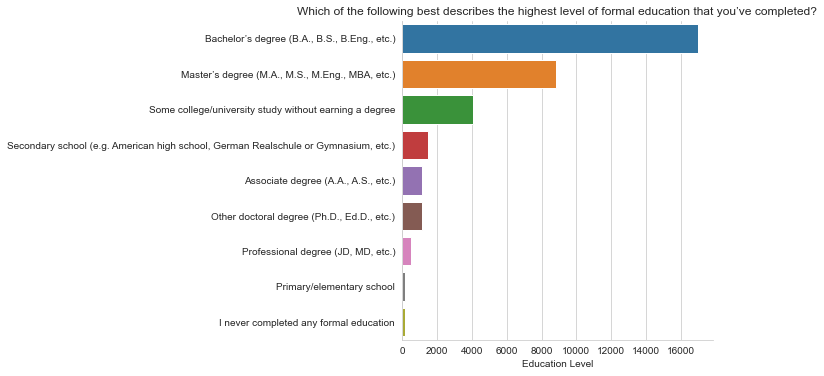

In [ ]:
plt.figure(figsize=(18,6))
sns.catplot(data=edu_counts,x='EdLevel',y=edu_counts.index,kind='bar')
plt.title(questions.EdLevel)
plt.xlabel('Education Level')


### The chart shows that over half of the people have Masters of Bachelor degree with people with Bachelor degrees being the highest are nearly more than the combination of the rest of the education. Lets check the percentage of Bachelor degree holders with the pie chart

In [ ]:
import plotly.express as px
fig = px.pie(edu_counts, values='EdLevel', names=edu_counts.index, title=questions.EdLevel, width= 1200, height= 500)
fig.show()


### This time, I will check which undergraduate field are they from. I will directly check the percentage with the bar plot

In [ ]:
undergrad_counts = analysis_data.UndergradMajor.value_counts()
total_undergrad = analysis_data.UndergradMajor.count()
undergrad_pct = undergrad_counts * 100 / total_undergrad
undergrad_pct

Computer science, computer engineering, or software engineering                   62.397165
Another engineering discipline (such as civil, electrical, mechanical, etc.)       9.163457
Information systems, information technology, or system administration              7.909413
A natural science (such as biology, chemistry, physics, etc.)                      4.615622
Mathematics or statistics                                                          3.715914
Web development or web design                                                      2.877831
A business discipline (such as accounting, finance, marketing, etc.)               2.606686
A humanities discipline (such as literature, history, philosophy, etc.)            2.184563
A social science (such as anthropology, psychology, political science, etc.)       1.864120
Fine arts or performing arts (such as graphic design, music, studio art, etc.)     1.534432
I never declared a major                                                        

Text(0.5, 0, 'Percentage')

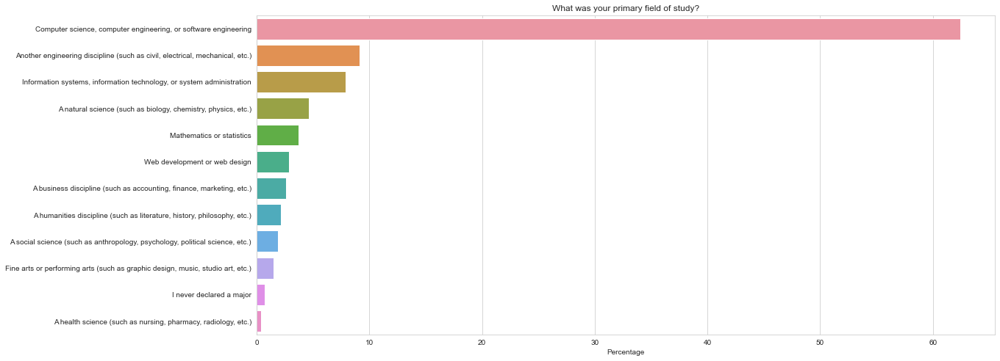

In [ ]:
plt.figure(figsize=(18,8))
sns.barplot(x=undergrad_pct, y=undergrad_pct.index)
plt.title(questions.UndergradMajor)
plt.xlabel('Percentage')

### It turns out that 40% of programmers holding a college degree have a field of study other than computer science which is very encouraging. It seems to suggest that while a college education is helpful in general, you do not need to pursue a major in computer science to become a successful programmer.

## Employment


In [ ]:
emp_counts = analysis_data['Employment'].value_counts()
emp_counts = pd.DataFrame(emp_counts)
emp_counts

,Employment
Employed full-time,30517
"Independent contractor, freelancer, or self-employed",3326
Employed part-time,1095


<AxesSubplot:title={'center':'Which of the following best describes your current employment status?'}, ylabel='Employment'>

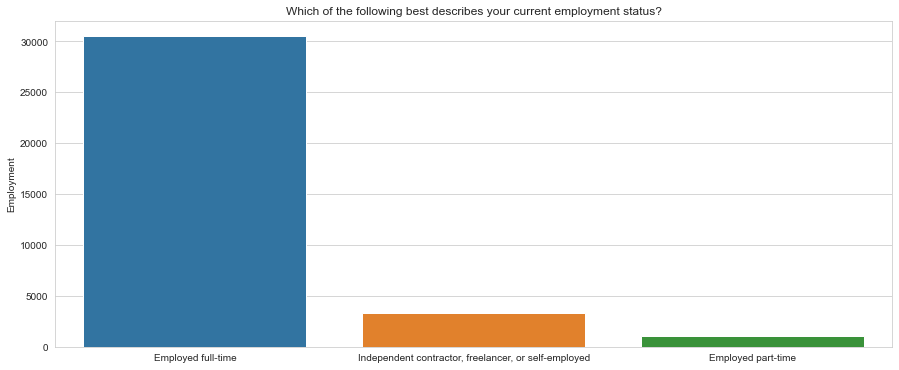

In [ ]:
plt.figure(figsize=(15,6))
plt.title(questions.Employment)
sns.barplot(data=emp_counts,y=emp_counts.Employment,x=emp_counts.index)

### It appears that most of the programmers are employed full time over 30000 and part time being the lowest. The independent contract, freelancer or self-employed are around 4000.

## Programming Languages

### First of all, I will check what languages they are using right now

### Languages Worked With

In [ ]:
analysis_data.LanguageWorkedWith.value_counts()

HTML/CSS;JavaScript;PHP;SQL                                                                               675
C#;HTML/CSS;JavaScript;SQL                                                                                631
C#;HTML/CSS;JavaScript;SQL;TypeScript                                                                     594
HTML/CSS;JavaScript;TypeScript                                                                            521
HTML/CSS;JavaScript                                                                                       484
                                                                                                         ... 
Assembly;Bash/Shell/PowerShell;C;C#;C++;Go;Haskell;HTML/CSS;JavaScript;Perl;Python;Rust;SQL;TypeScript      1
Bash/Shell/PowerShell;C;C#;C++;HTML/CSS;Java;Kotlin;Python;Rust;Scala;SQL                                   1
Assembly;Bash/Shell/PowerShell;C;C#;C++;Java;Python;Rust                                                    1
HTML/CSS;P

### I'll split this column into a data frame containing a column of each language listed in the options.

In [ ]:
#create a splitting function
def split_multicolumn(col_series):
    result_df = col_series.to_frame()
    options = []
    # Iterate over the column
    for idx, value  in col_series[col_series.notnull()].iteritems():
        # Break each value into list of options
        for option in value.split(';'):
            # Add the option as a column to result
            if not option in result_df.columns:
                options.append(option)
                result_df[option] = False
            # Mark the value in the option column as True
            result_df.at[idx, option] = True
    return result_df[options]

In [ ]:
language_worked_df = split_multicolumn(analysis_data.LanguageWorkedWith)

In [ ]:
language_worked_df.head(10)

,Python,SQL,HTML/CSS,JavaScript,PHP,Java,C#,Swift,C,TypeScript,...,C++,Go,Haskell,Ruby,Rust,Scala,Assembly,Objective-C,Dart,Julia
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7,True,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
8,False,False,True,True,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9,True,True,True,True,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
10,False,False,False,True,False,False,True,True,False,False,...,False,False,False,False,False,False,False,False,False,False
11,False,False,True,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
12,True,False,False,True,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
13,False,True,True,True,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
15,False,False,True,True,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
16,True,True,True,True,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### It appears that a total of 25 languages were included among the options. Let's aggregate these to identify how many times each language is selected

In [ ]:
language_worked_df_count = language_worked_df.sum().sort_values(ascending=False)
language_worked_df_count

JavaScript               24483
HTML/CSS                 21799
SQL                      20062
Python                   14411
Java                     12932
Bash/Shell/PowerShell    12779
C#                       11465
TypeScript               10233
PHP                       8686
C++                       6619
C                         5730
Go                        3320
Kotlin                    2803
Ruby                      2730
Swift                     2074
VBA                       2067
R                         1844
Rust                      1658
Objective-C               1496
Assembly                  1456
Scala                     1393
Dart                      1195
Perl                      1125
Haskell                    562
Julia                      243
dtype: int64

Text(0.5, 0, 'Count')

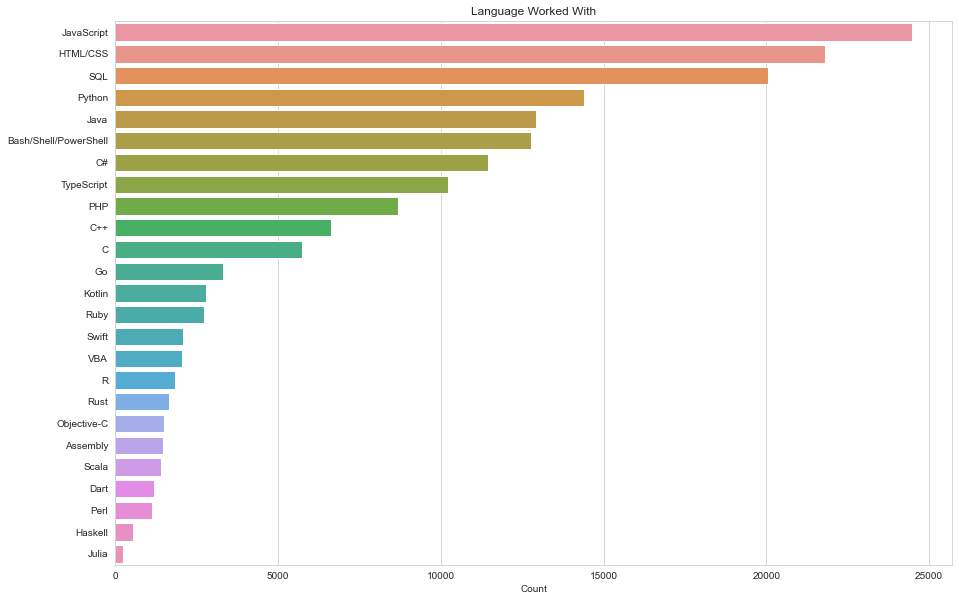

In [ ]:
plt.figure(figsize=(15, 10))
sns.barplot(x=language_worked_df_count, y=language_worked_df_count.index)
plt.title('Language Worked With')
plt.xlabel('Count')

### Unsurprisingly, Javascript and HTML/CSS comes out at the top as web development is one of today's most sought skills. It also happens to be one of the easiest to get started. SQL is necessary for working with relational databases, so it's no surprise that most programmers work with SQL regularly. Python seems to be the popular choice for other forms of development, beating out Java, which was the industry standard for server & application development for over two decades.

### The languages can also be described with word cloud which will show what languages are mostly mentioned when they are asked about which programming languages they have worked with

In [ ]:
from wordcloud import WordCloud

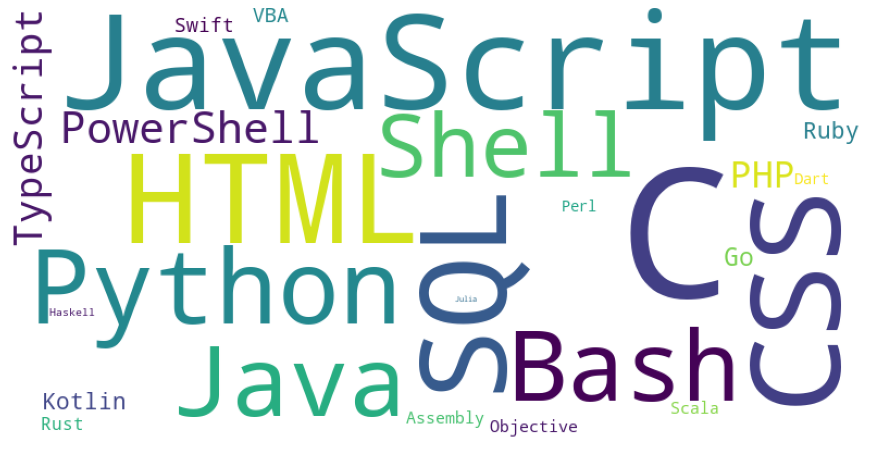

In [ ]:
words = ' '.join((lang for lang in analysis_data.LanguageWorkedWith.dropna().str.replace(';', ' ').str.replace(',', ' ')))

wc = WordCloud(collocation_threshold=int(1e6), width=800, height=400, background_color='white').generate(words)

plt.figure(figsize=(16,8))
plt.axis("off")
plt.grid(False)
plt.imshow(wc)

### Here, we see that Javascript is the most mentioned when they are asked

### Secondly, I will check what languages are they desired to learn next year

### Language Desried To Learn Next Year

In [ ]:
language_desired_df = split_multicolumn(analysis_data.LanguageDesireNextYear)
language_desired_df_count = language_desired_df.sum().sort_values(ascending=False)
language_desired_df_count

JavaScript               16317
Python                   15604
HTML/CSS                 12986
SQL                      12784
TypeScript               11811
C#                        8711
Go                        8295
Bash/Shell/PowerShell     7790
Java                      7270
Rust                      6914
Kotlin                    5801
C++                       4844
PHP                       3746
Swift                     3251
C                         2963
Dart                      2709
Ruby                      2404
R                         2268
Scala                     2234
Haskell                   1720
Assembly                  1010
Julia                      874
Objective-C                758
Perl                       555
VBA                        475
dtype: int64

Text(0.5, 0, 'Count')

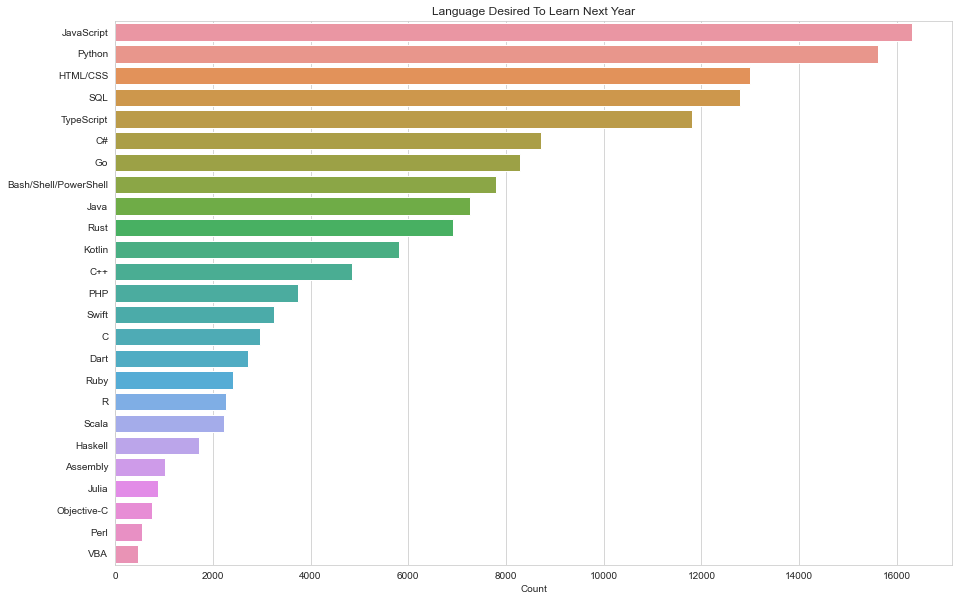

In [ ]:
plt.figure(figsize=(15, 10))
sns.barplot(x=language_desired_df_count, y=language_desired_df_count.index)
plt.title('Language Desired To Learn Next Year')
plt.xlabel('Count')

### Unsurprising, Javascript is still on the top since almost all the programmers use this langauge. However, when I saw the second place, it is Python which is my most favourite languge :). I think people want to learn this because of the fact of widely ranged usage and easy-to-learn langauge among others.

### Most Loved Language (Worked with the language before and continue wanting to learn)

### I will find the relationship between languges worked with before and intrested to learn next year to find the most loved language which programmers are desired to learn even though they have worked with it before

In [ ]:
language_loved_df = language_worked_df & language_desired_df

### Finding how many percentage that a progammer will learn despite he/she worked with it before

In [ ]:
language_loved_percentages = ((language_loved_df.sum() / language_worked_df.sum()) * 100).sort_values(ascending=False)

Text(0.5, 0, 'Count')

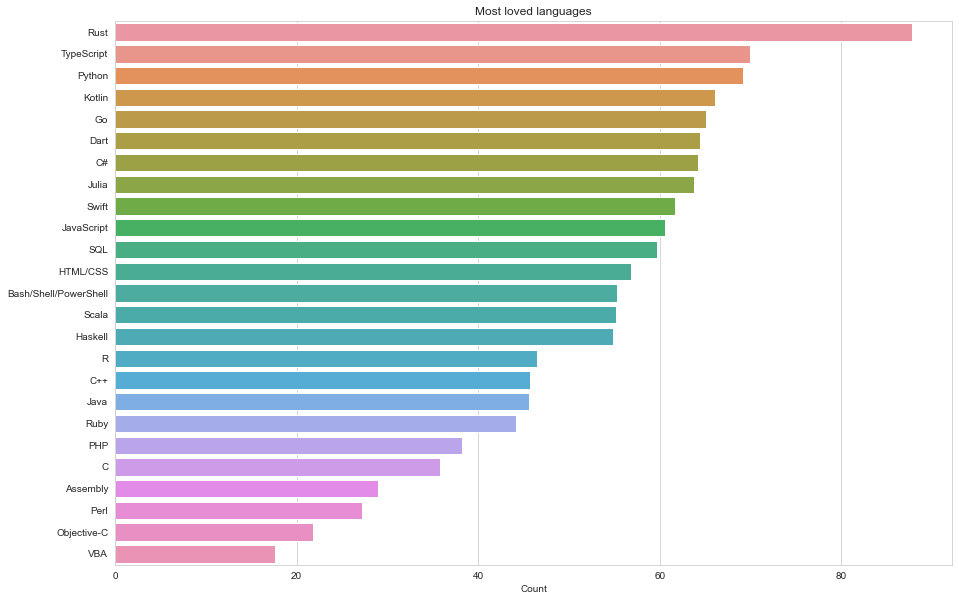

In [ ]:
plt.figure(figsize=(15, 10))
sns.barplot(x=language_loved_percentages, y=language_loved_percentages.index)
plt.title("Most loved languages")
plt.xlabel('Count')

### It is very surprsing to see JavaScript is not in the top list and Rust is most loved programming language among people. The second one is TypeScript which is an alternative for JavaScript. The third one is ofcourse my most favourite language (python) which is easy-to-learn language and very widely useful.

## Working Hours

In [ ]:
workhrs_df = analysis_data.groupby('Country')[['WorkWeekHrs']].mean().sort_values('WorkWeekHrs', ascending=False)
workhrs_df = workhrs_df.head(10)
workhrs_df

,WorkWeekHrs
Country,
Guyana,60.000000
Haiti,60.000000
Iraq,53.125000
Kuwait,52.166667
Tajikistan,50.000000
Jordan,46.692308
Maldives,45.500000
United Republic of Tanzania,45.200000
Andorra,45.000000


<AxesSubplot:title={'center':'On average, how many hours per week do you work? Please enter a whole number in the box.'}, xlabel='Country', ylabel='WorkWeekHrs'>

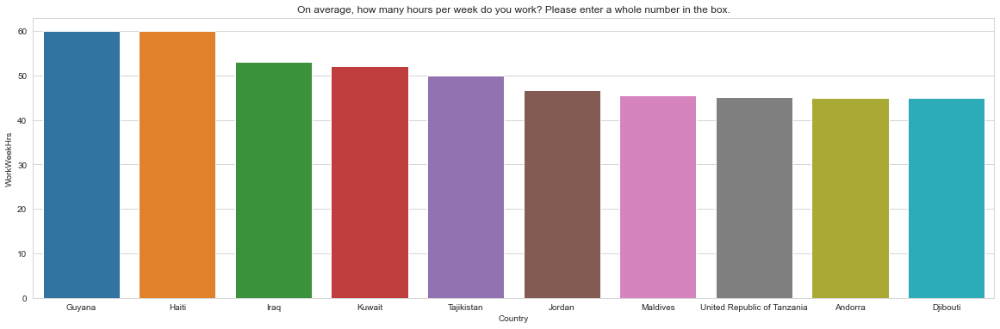

In [ ]:
plt.figure(figsize=(20,6))
plt.title(questions.WorkWeekHrs)
sns.barplot(data=workhrs_df,y=workhrs_df.WorkWeekHrs,x=workhrs_df.index)

### In the bar chart, I can see that both Guyana and Haiti has the highest number of work weekly hours with the average of 60 hours per week and Iraq being the third highest.

## Compensation vs Working Hours

### Let's visualize the relationship between working hours and compensation for from different countries

In [ ]:
import plotly.express as px

In [ ]:
px.scatter(analysis_data, x='WorkWeekHrs', y='ConvertedComp', color='Country', title='Compensation vs Weekly Work Hours')

### Lets narrow it down to comparing only two countries US and India

In [ ]:
usa_india_df = analysis_data[analysis_data.Country.isin(['United States', 'India'])]

px.scatter(usa_india_df, x='WorkWeekHrs', y='ConvertedComp', color='Country', title='Compensation vs Weekly Work Hours')

## Age vs Years Of Professional Coding

Text(0, 0.5, 'Years of professional coding experience')

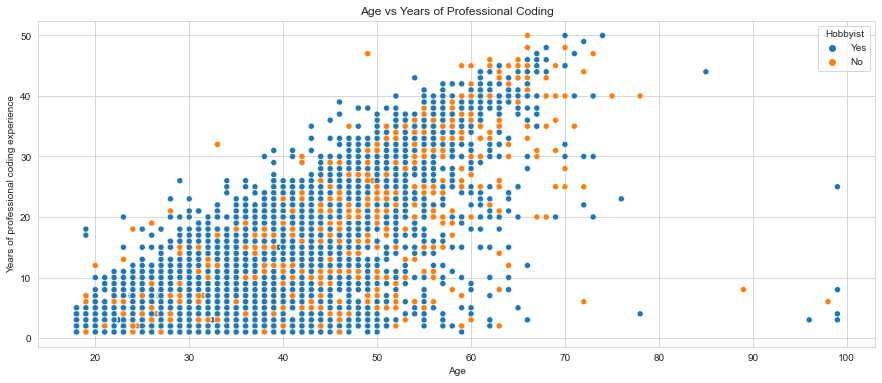

In [ ]:
plt.figure(figsize=(15,6))
plt.title('Age vs Years of Professional Coding')
sns.scatterplot(data=analysis_data,x='Age', y='YearsCodePro', hue='Hobbyist')
plt.xlabel("Age")
plt.ylabel("Years of professional coding experience")

### You can see points all over the graph, which indicates that you can start programming professionally at any age. Many people who have been coding for several decades professionally also seem to enjoy it as a hobby.

## First Age of Coding

<AxesSubplot:title={'center':'At what age did you write your first line of code or program? (e.g., webpage, Hello World, Scratch project)'}, xlabel='Age1stCode', ylabel='Count'>

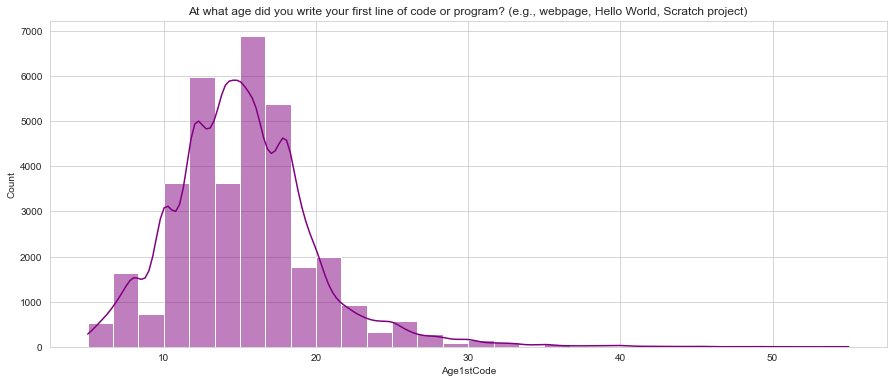

In [ ]:
plt.figure(figsize=(15,6))
plt.title(questions.Age1stCode)
sns.histplot(data=analysis_data,x='Age1stCode', bins=30, kde=True, color='purple')

### Most people seemed to have had some exposure to programming before the age of 40 and most normaly started in teenage life.